# Load libraries and data

In [1]:
import scipy.io as scio
from scipy.interpolate import Rbf
import numpy as np 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

In [2]:
data3 = scio.loadmat('../Data/tissue3_1.mat')
'''data4 = scio.loadmat('tissue4.mat')
data5 = scio.loadmat('tissue5.mat')
data6 = scio.loadmat('tissue6.mat')
data7 = scio.loadmat('tissue7_1.mat')
data8 = scio.loadmat('tissue8_1.mat')
data9 = scio.loadmat('tissue9.mat')
data10 = scio.loadmat('tissue10.mat')
data14 = scio.loadmat('tissue14.mat')
data24 = scio.loadmat('tissue24.mat')'''

"data4 = scio.loadmat('tissue4.mat')\ndata5 = scio.loadmat('tissue5.mat')\ndata6 = scio.loadmat('tissue6.mat')\ndata7 = scio.loadmat('tissue7_1.mat')\ndata8 = scio.loadmat('tissue8_1.mat')\ndata9 = scio.loadmat('tissue9.mat')\ndata10 = scio.loadmat('tissue10.mat')\ndata14 = scio.loadmat('tissue14.mat')\ndata24 = scio.loadmat('tissue24.mat')"

In [3]:
calibration = scio.loadmat('../Data/cal_14.mat')
wavenumbers = calibration['Cal'][0][0][0]/10

In [4]:
spectra = [
    data3['map_t3'],
    '''data4['map_t4'],
    data5['map_t5_1'],
    data6['map_t6'],
    data7['map_t7_1'],
    data8['map_t8_1'],
    data9['map_t9_1'],
    data10['map_t10'],
    data14['map_t14'],
    data24['map_t24']'''
]

In [14]:
def remove_spikes_by_line(data, std_lim=5, polynomial=6, plot=1):
    """
    data: input 
    std_lim:
    polynomial: order of fitted polynomial
    """
    
    rows = data.shape[0]
    cols = data.shape[1]
    if rows*cols < 30000:
        std_lim = 6
    removed = 0

    for i in range(rows):

        x = [i for i in range(cols)]
        y = data[i,:]

        avg = np.mean(y)
        std = np.std(y)

        fit = np.polyfit(x,y,polynomial)
        p = np.poly1d(fit)
        z = p(x) + std_lim * std
        
        outliers = y > z
        removed += np.count_nonzero(outliers)

        new_y = [y[k] if outliers[k]==False else (y[k-1]+y[k+1])/2 if (k!=0 and k!=cols-1) else avg for k in range(cols)]

        if plot == 1:
            plt.figure()
            plt.plot(y, linewidth=1.5, label='original')
            plt.plot(z, linewidth=1.5, label='polynomial + 5*std')
            plt.plot(new_y, 'r:', linewidth=1.5, label='result')
            plt.title('Spike removal - row ' + str(i))
            plt.ylabel('Raman Intensity [a.u.]')
            plt.xlabel('y [a.u.]')
            plt.legend()
    
    removed_percent = removed / (rows*cols) * 100

    return y, z, new_y, removed_percent

In [ ]:
for data in spectra:
    removed = []
    for i in range(1024):
        _,_,_, rem = remove_spikes_by_line(data[:,:,i])
        removed.append(rem)
    print(np.mean(removed), np.std(removed))

/var/folders/tl/_smmzcf56jn3pnwyc8ggqhdc0000gn/T/ipykernel_25164/3693930732.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


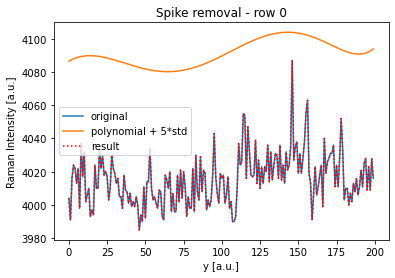

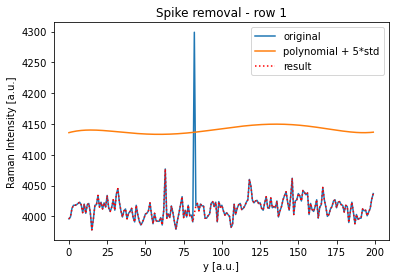

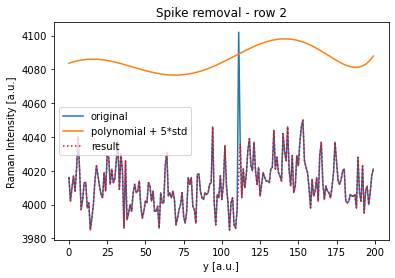

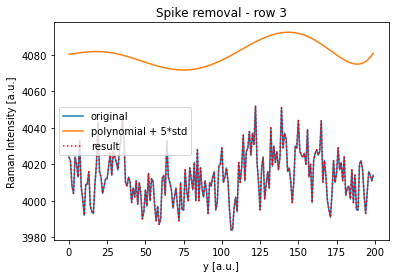

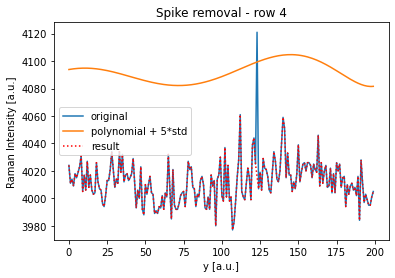

...

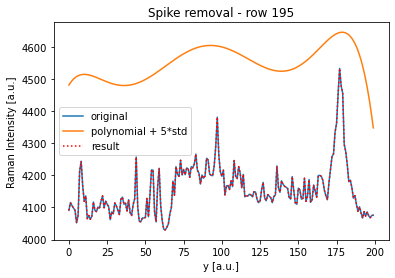

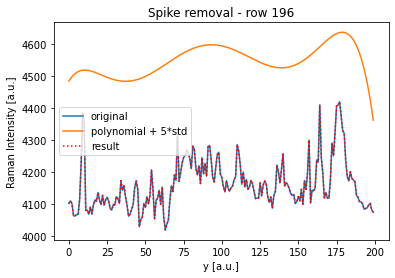

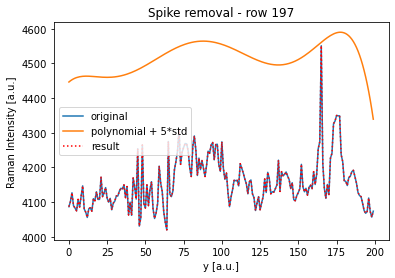

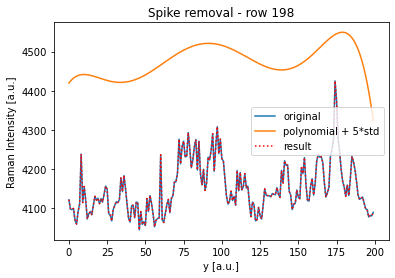

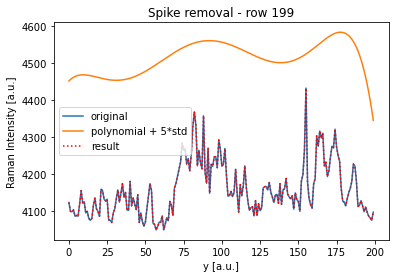

In [16]:
y, z, new_y, rem = remove_spikes_by_line(spectra[0][:,:,500])